# Example-12: Gingerbreadman map

In [1]:
# In this example various chaos indicators are employed to explote the Gingerbreadman map

In [2]:
# Import

import numpy

from tqdm import tqdm

# JAX

import jax
from jax import jit
from jax import vmap
from jax import jacrev

# Forward and inverse mappings

from tohubohu.util import gingerbread_man_forward
from tohubohu.util import gingerbread_man_inverse

# Tohubohu

from tohubohu import rem
from tohubohu import exponential
from tohubohu import frequency
from tohubohu import fma
from tohubohu import fli
from tohubohu import gali

# Plotting

from matplotlib import pyplot as plt
from matplotlib import colormaps

cmap = colormaps.get_cmap('viridis')
cmap.set_bad(color='lightgray')

cmap_r = colormaps.get_cmap('viridis_r')
cmap_r.set_bad(color='lightgray')

In [3]:
# Set data type

jax.config.update("jax_enable_x64", True)

In [4]:
# Set device

device, *_ = jax.devices('cuda')
jax.config.update('jax_default_device', device)

In [5]:
# Set number of iteratons

n = 2**12

In [6]:
# Set initial grid in (qx, qy) plane

m = 3001

extent = (-10.0, 15.0, -10.0, 15.0)

qs = jax.numpy.linspace(-10.0, 15.0, m)
ps = jax.numpy.linspace(-10.0, 15.0, m)
xs = jax.numpy.stack(jax.numpy.meshgrid(qs, ps, indexing='ij')).swapaxes(-1, 0).reshape(m*m, -1)
xs = jax.numpy.array_split(xs, m)

## REM

In [7]:
# Set REM indicator
# Note, no error is added after the forward map iteration, return error is solely due to round-off

@jit
def evaluate_rem(x, epsilon=1.0E-16):
    return jax.numpy.log10(epsilon + rem(n, gingerbread_man_forward, gingerbread_man_inverse, epsilon=0.0)(x))

x = jax.numpy.array([0.1, 0.1])
out = evaluate_rem(x)

In [8]:
# Evaluate indicator

xb, *xr = xs
fj = jit(vmap(evaluate_rem))
out = [fj(xb)]

for xb in tqdm(xr):
    out.append(fj(xb))
out = jax.numpy.concatenate(out)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [01:51<00:00, 26.84it/s]


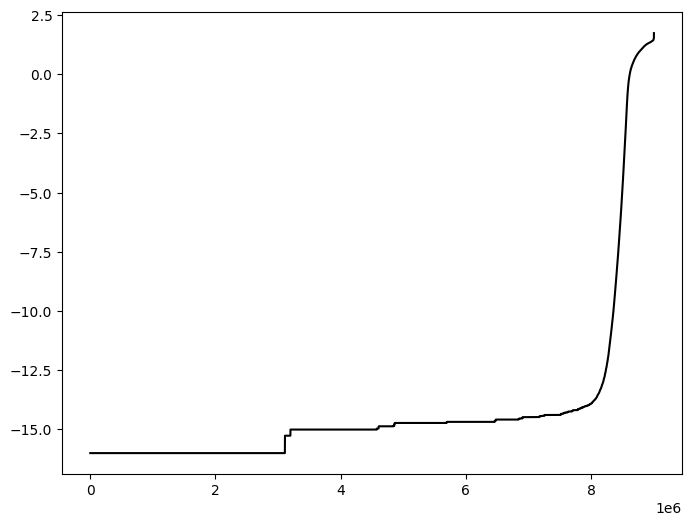

In [9]:
# Plot indicator

plt.figure(figsize=(8, 6))
plt.plot(jax.numpy.sort(out), color='black')
plt.show()

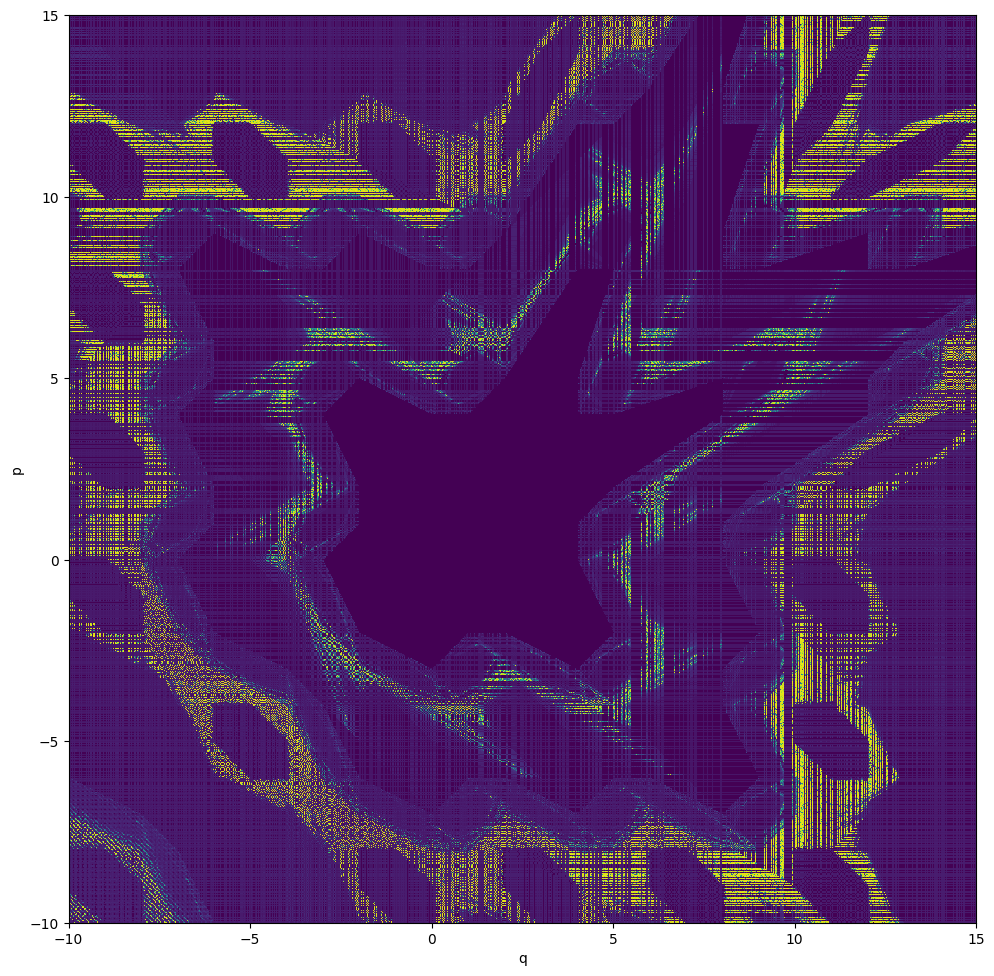

In [10]:
# Color plot

data = numpy.array(out)
data = data.reshape(m, m)

plt.figure(figsize=(10, 10))
plt.imshow(data, aspect='equal', vmin=-16, vmax=2, origin='lower', cmap=cmap, interpolation='nearest', extent=extent)
plt.xlabel('q')
plt.ylabel('p')
plt.tight_layout()
plt.show()

## Frequency (fractional part)

In [11]:
# Frequency

window = exponential(n)

@jit
def evaluate_frequency(x):
    return frequency(window, gingerbread_man_forward)(x).squeeze()

x = jax.numpy.array([0.1, 0.1])
out = evaluate_frequency(x)

In [12]:
# Evaluate indicator

xb, *xr = xs
fj = jit(vmap(evaluate_frequency))
out = [fj(xb)]

for xb in tqdm(xr):
    out.append(fj(xb))
out = jax.numpy.concatenate(out)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [01:30<00:00, 33.09it/s]


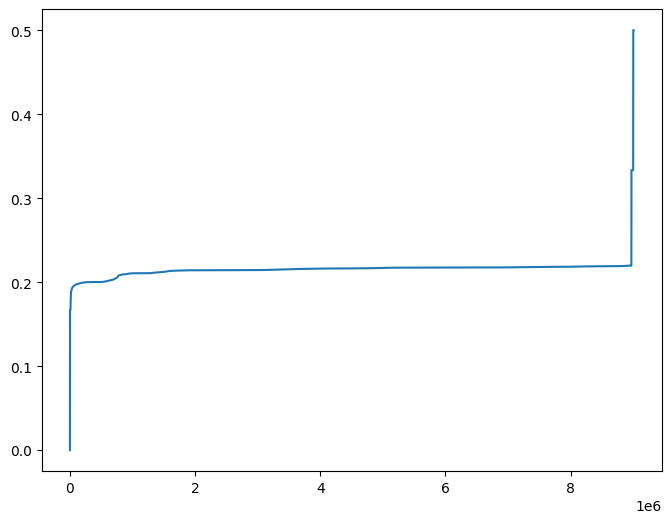

In [13]:
# Plot indicator (full range)

plt.figure(figsize=(8, 6))
plt.plot(jax.numpy.sort(out))
plt.show()

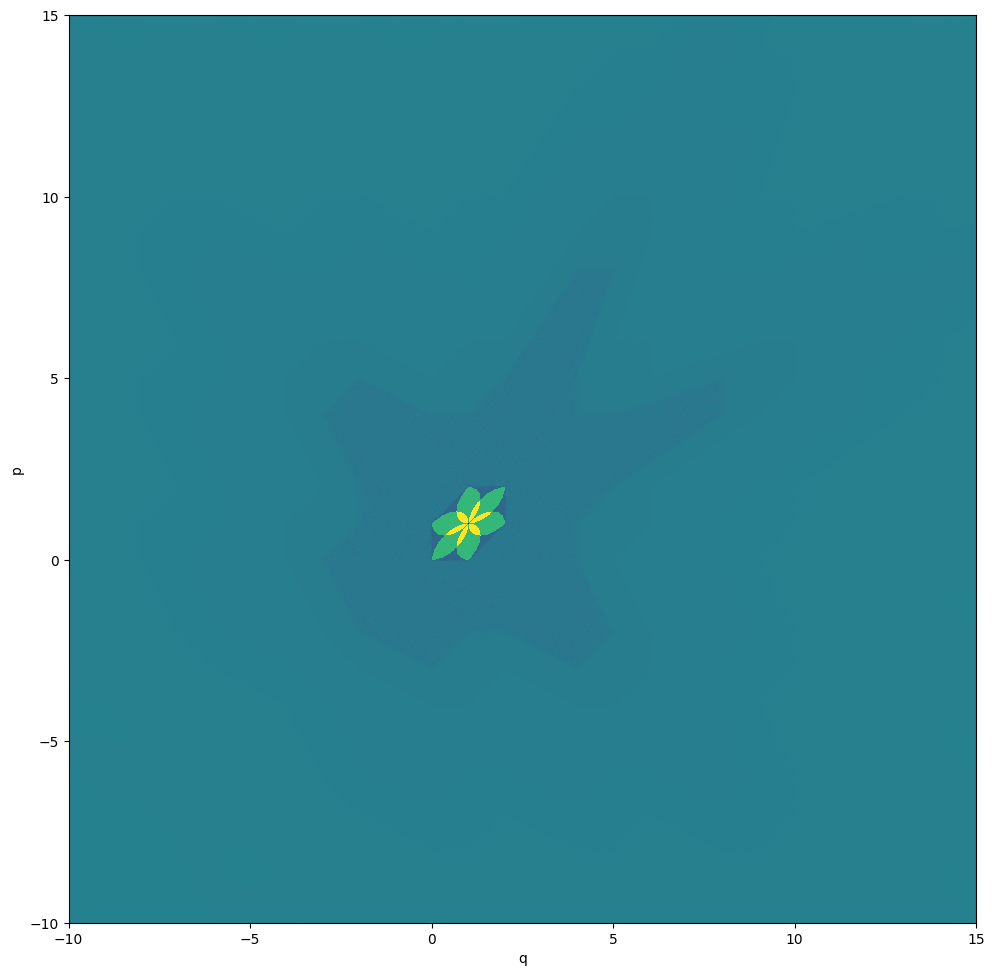

In [14]:
# Color plot

data = numpy.array(out)
data = data.reshape(m, m)

plt.figure(figsize=(10, 10))
plt.imshow(data, aspect='equal', vmin=0, vmax=0.5, origin='lower', cmap=cmap, interpolation='nearest', extent=extent)
plt.xlabel('q')
plt.ylabel('p')
plt.tight_layout()
plt.show()

## Frequency (derivative norm)

In [15]:
# Frequency (derivative)

window = exponential(n)

@jit
def evaluate_frequency_derivative_norm(x, epsilon=1.0E-16):
    return jax.numpy.log10(epsilon + jax.numpy.linalg.norm(jacrev(evaluate_frequency)(x).squeeze()))

x = jax.numpy.array([0.1, 0.1])
out = evaluate_frequency_derivative_norm(x)

In [16]:
# Evaluate indicator

xb, *xr = xs
fj = jit(vmap(evaluate_frequency_derivative_norm))
out = [fj(xb)]

for xb in tqdm(xr):
    out.append(fj(xb))
out = jax.numpy.concatenate(out)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [03:59<00:00, 12.50it/s]


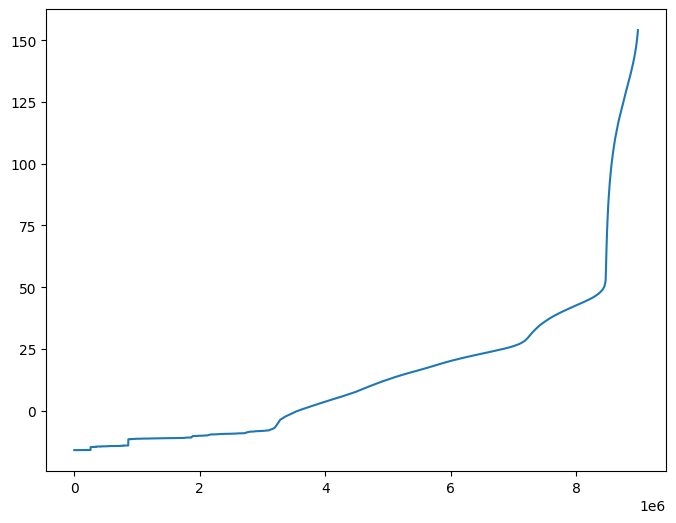

In [17]:
# Plot indicator (full range)

plt.figure(figsize=(8, 6))
plt.plot(jax.numpy.sort(out))
plt.show()

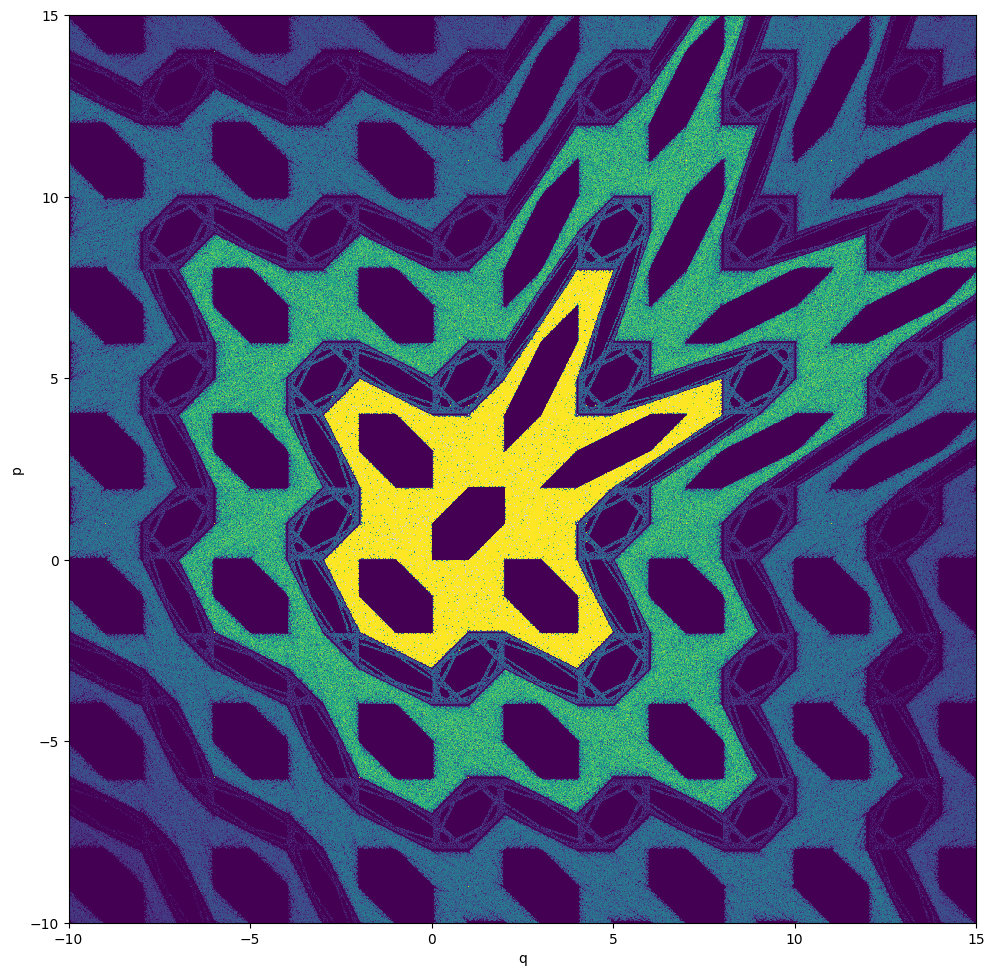

In [18]:
# Color plot

data = numpy.array(out)
data = data.reshape(m, m)

plt.figure(figsize=(10, 10))
plt.imshow(data, aspect='equal', vmin=0, vmax=64, origin='lower', cmap=cmap, interpolation='nearest', extent=extent)
plt.xlabel('q')
plt.ylabel('p')
plt.tight_layout()
plt.show()

## FMA

In [19]:
# FMA

@jit
def evaluate_fma(x, epsilon=1.0E-16):
    return jax.numpy.log10(epsilon + jax.numpy.sqrt(jax.numpy.sum(jax.numpy.diff(fma(2**1, window, gingerbread_man_forward)(x).T)**2)))

x = jax.numpy.array([0.1, 0.1])
out = evaluate_fma(x)

In [20]:
# Evaluate indicator

xb, *xr = xs
fj = jit(vmap(evaluate_fma))
out = [fj(xb)]

for xb in tqdm(xr):
    out.append(fj(xb))
out = jax.numpy.concatenate(out)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [03:01<00:00, 16.54it/s]


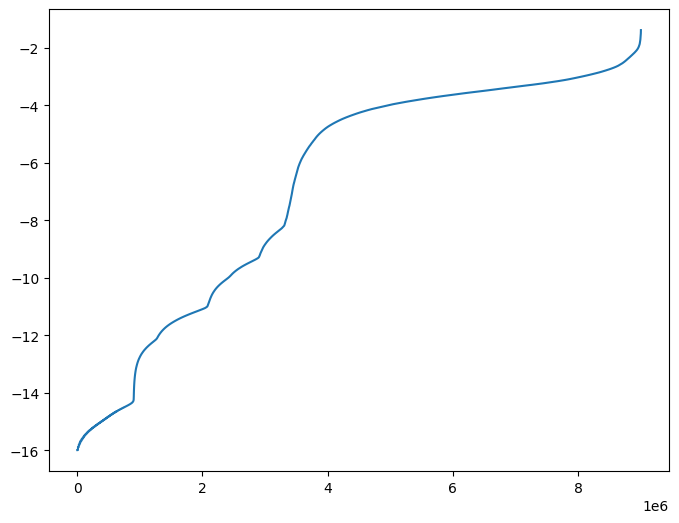

In [21]:
# Plot indicator (full range)

plt.figure(figsize=(8, 6))
plt.plot(jax.numpy.sort(out))
plt.show()

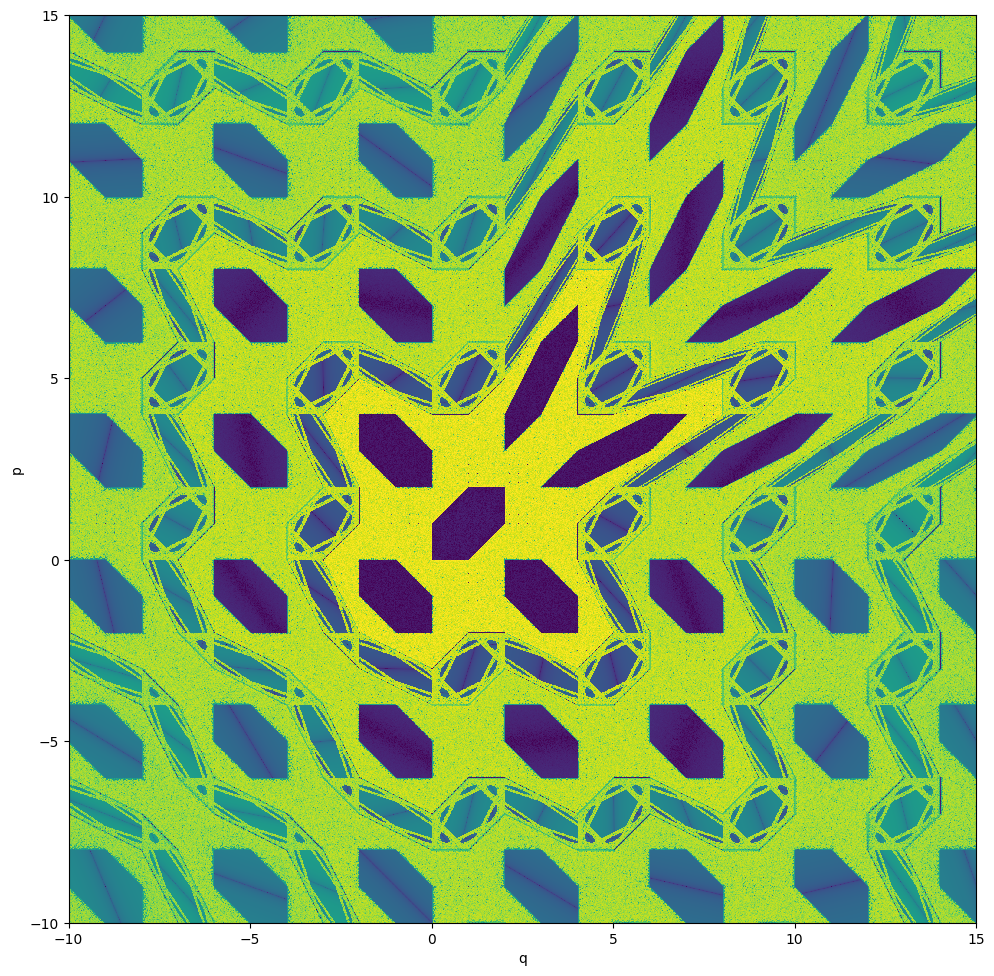

In [22]:
# Color plot

data = numpy.array(out)
data = data.reshape(m, m)

plt.figure(figsize=(10, 10))
plt.imshow(data, aspect='equal', vmin=-16, vmax=-2, origin='lower', cmap=cmap, interpolation='nearest', extent=extent)
plt.xlabel('q')
plt.ylabel('p')
plt.tight_layout()
plt.show()

## FLI

In [23]:
# FLI

@jit
def evaluate_fli(x):
    return fli(n, gingerbread_man_forward, normalize=False)(x, v)

x = jax.numpy.array([0.1, 0.1])
v = jax.numpy.array([1.0, 0.0])

out = evaluate_fli(x)

In [24]:
# Evaluate indicator

xb, *xr = xs
fj = jit(vmap(evaluate_fli))
out = [fj(xb)]

for xb in tqdm(xr):
    out.append(fj(xb))
out = jax.numpy.concatenate(out)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [01:38<00:00, 30.50it/s]


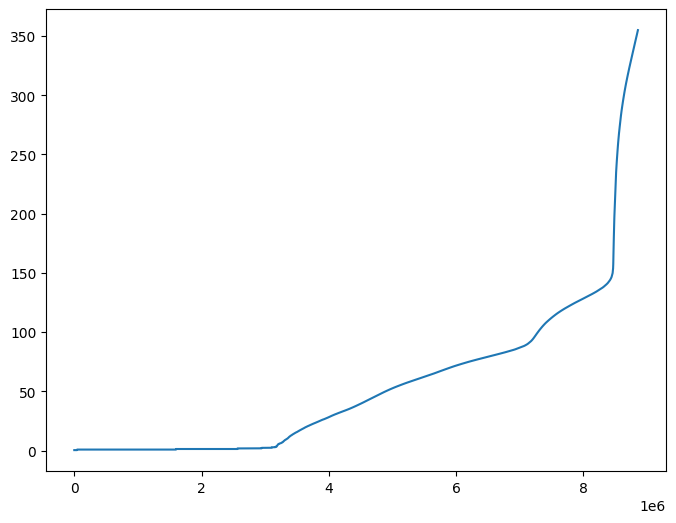

In [25]:
# Plot indicator (full range)

plt.figure(figsize=(8, 6))
plt.plot(jax.numpy.sort(out))
plt.show()

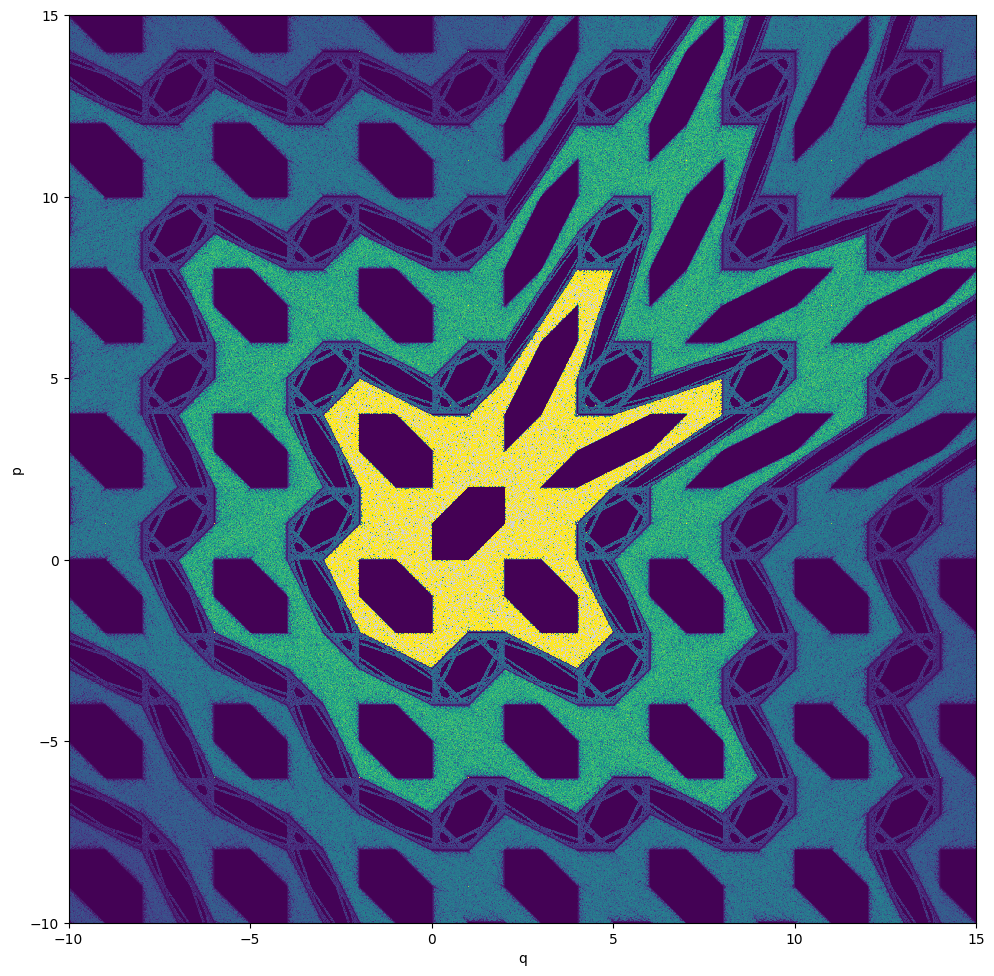

In [26]:
# Color plot

data = numpy.array(out)
data = data.reshape(m, m)

plt.figure(figsize=(10, 10))
plt.imshow(data, aspect='equal', vmin=0, vmax=200, origin='lower', cmap=cmap, interpolation='nearest', extent=extent)
plt.xlabel('q')
plt.ylabel('p')
plt.tight_layout()
plt.show()

## GALI

In [27]:
# GALI

@jit
def evaluate_gali(x, epsilon=1.0E-16):
    return jax.numpy.log10(epsilon + gali(n, gingerbread_man_forward)(x, vs))

x = jax.numpy.array([0.25, 0.25])
vs = jax.numpy.array([[1.0, 0.0], [0.0, 1.0]])

out = evaluate_gali(x)

In [28]:
# Evaluate indicator

xb, *xr = xs
fj = jit(vmap(evaluate_gali))
out = [fj(xb)]

for xb in tqdm(xr):
    out.append(fj(xb))
out = jax.numpy.concatenate(out)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:11<00:00, 22.83it/s]


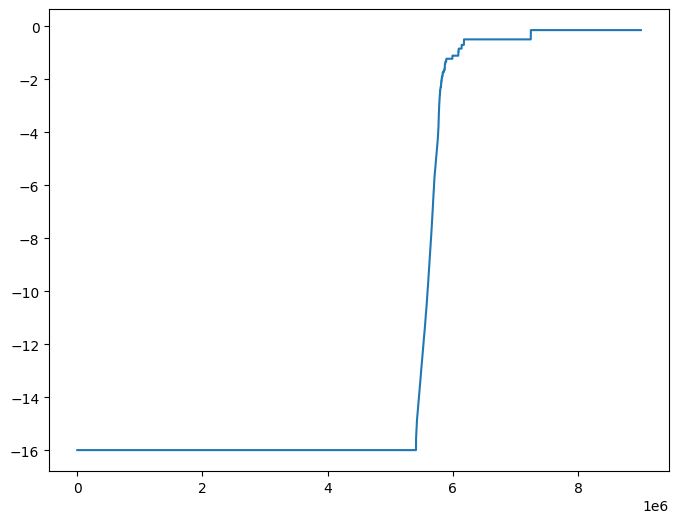

In [29]:
# Plot indicator (full range)

plt.figure(figsize=(8, 6))
plt.plot(jax.numpy.sort(out))
plt.show()

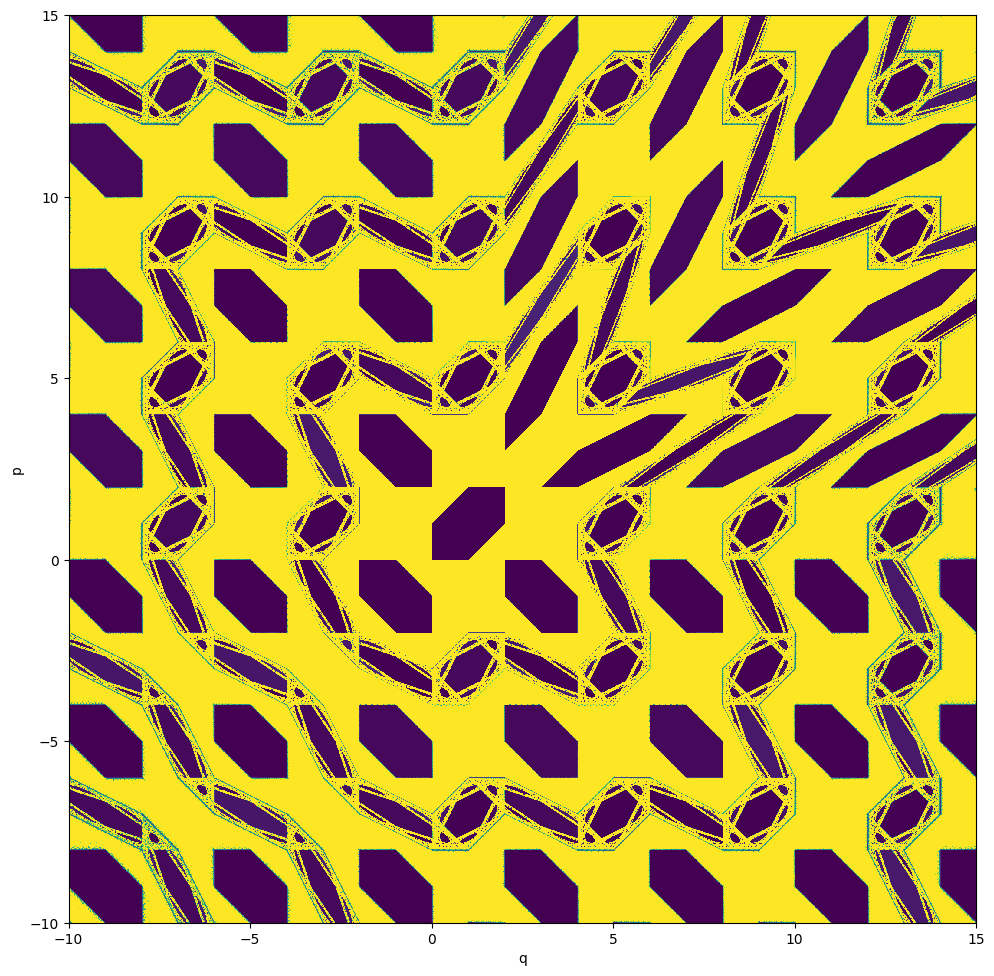

In [30]:
# Color plot

data = numpy.array(out)
data = data.reshape(m, m)

plt.figure(figsize=(10, 10))
plt.imshow(data, aspect='equal', vmin=jax.numpy.min(data), vmax=jax.numpy.max(data), origin='lower', cmap=cmap_r, interpolation='nearest', extent=extent)
plt.xlabel('q')
plt.ylabel('p')
plt.tight_layout()
plt.show()

## Return map and rotational number (wolfram mathematica)

In [1]:
(* grid generation *)

ClearAll[meshgrid] ;
meshgrid[x_List, y_List] := Developer`ToPackedArray@{ConstantArray[x, Length[y]], Transpose[ConstantArray[y, Length[x]]]} ;

qs = Subdivide[-10, 15, 1000] ;
ps = Subdivide[-10, 15, 1000] ;

points = Flatten[Map[Transpose, Transpose[meshgrid[qs, ps]]], 1] ;

In [7]:
(* define mapping *)

ClearAll[mapping] ;
mapping[{q_, p_}] := {p, -q + Abs[p] + 1} ;

In [10]:
(* rotation number and period *)

ClearAll[fn] ;
fn[initial_, limit_: 10^9] := Block[
    {total = 0.0, current = initial, za, zb, next, period = limit},
    za = Complex @@ current ;
    Do[
        next = mapping[current] ;
        zb = Complex @@ next ;
        total += Arg[zb * Conjugate[za]] ;
        If[next == initial, period = count; Break[]] ;
        current = next ;
        za = zb,
        {count, limit}
    ] ;
    {total/(2 Pi), period}
] ;

{2201.99, Null}
{1002001, 2}
-Graphics-
-Graphics-
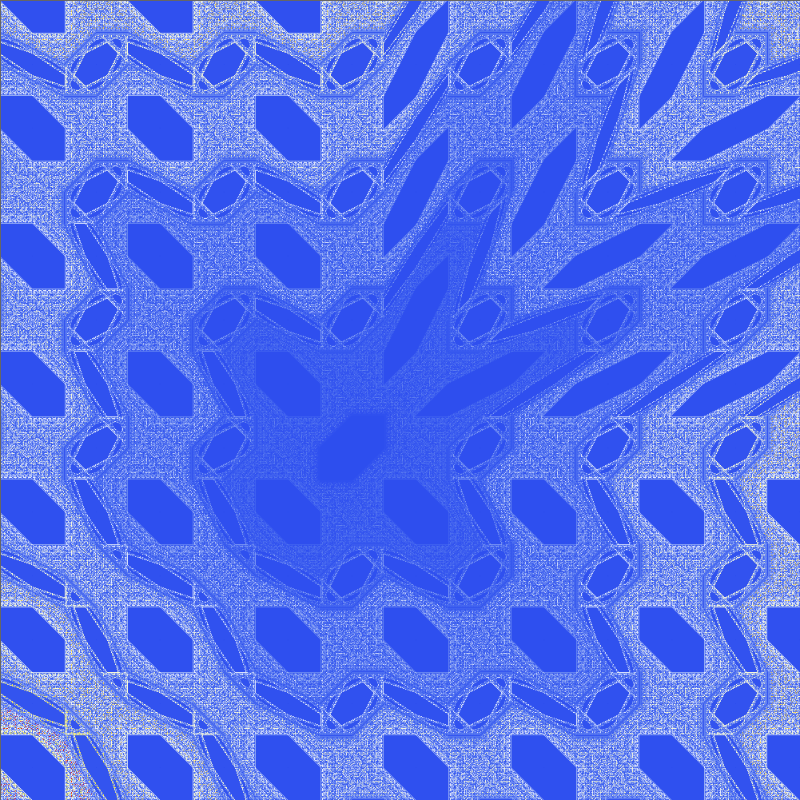
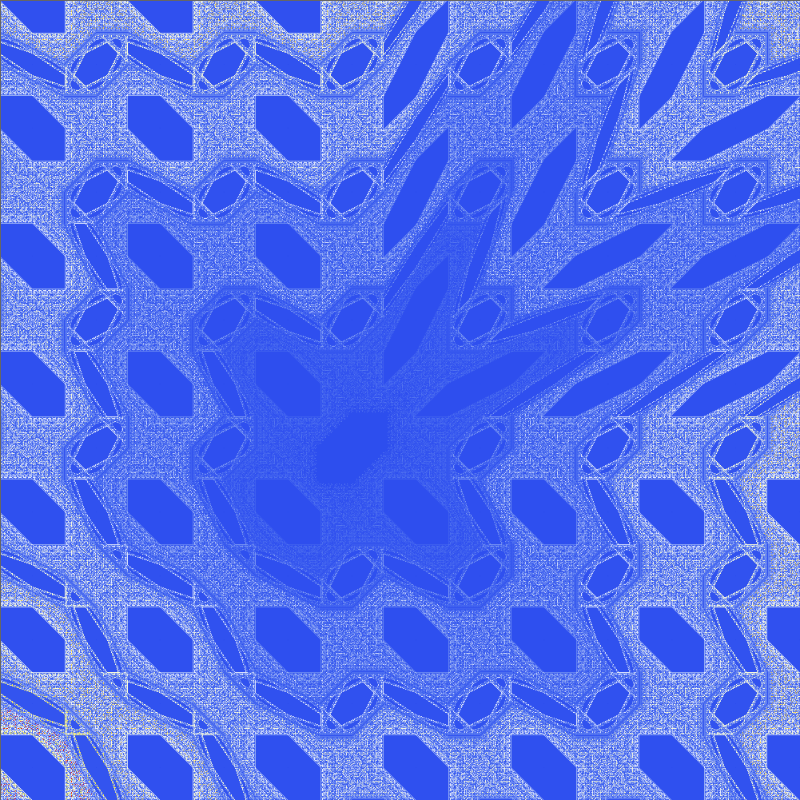

In [13]:
(* compute and plot return time and rotation number *)

data = ParallelTable[fn[point], {point, points}] ; // AbsoluteTiming
data // Dimensions

ArrayPlot[
    Partition[+data[[All, -1]], Sqrt[Length[data]]], 
    DataReversed -> True, 
    ColorFunction -> ColorData["TemperatureMap"], 
    PlotRangePadding -> 0, 
    ImagePadding -> 0,
    ImageSize -> 800
]

ArrayPlot[
    Partition[-data[[All, +1]], Sqrt[Length[data]]], 
    DataReversed -> True, 
    ColorFunction -> ColorData["TemperatureMap"], 
    PlotRangePadding -> 0, 
    ImagePadding -> 0,
    ImageSize -> 800
]

In [18]:
(* test rotation number accuracy *)

Chop[Max[Abs[Rationalize[data[[All, +1]]] - data[[All, +1]]]]]

(* test maximum return time *)

Max[data[[All, -1]]]

-10
7.48514 10
31242

-Graphics-
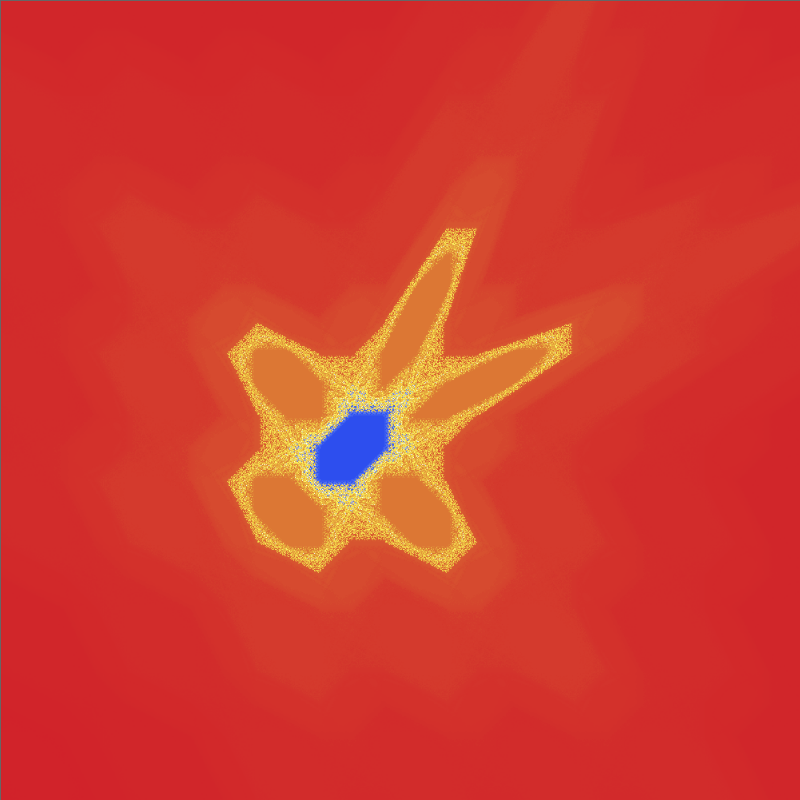

In [22]:
(* plot fractional frequency *)

ArrayPlot[
    Partition[-data[[All, +1]]/data[[All, -1]], Sqrt[Length[data]]], 
    DataReversed -> True, 
    ColorFunction -> ColorData["TemperatureMap"], 
    PlotRangePadding -> 0, 
    ImagePadding -> 0,
    ImageSize -> 800
]